<center>
<img align="center" src="http://sydney.edu.au/images/content/about/logo-mono.jpg">
</center>
<h1 align="center" style="margin-top:10px">Statistical Learning and Data Mining</h1>
<h2 align="center" style="margin-top:20px">Week 3 Tutorial: Feature Engineering</h2>
<br>

This notebook explores useful feature engineering tools for tabular data. Keep in mind that feature engineering is highly dependent on the context and the model.  Use your analytical skills to design good features for each situation.

Each specific step in feature engineering may not make much difference for the performance of the final model. However, these small improvements can add up to a significant increase in accuracy.

<a href="#1.-Ames-Housing-Data">Ames Housing Data</a> <br>
<a href="#2.-Data-cleaning">Data cleaning</a> <br>
<a href="#3.-Type-inference">Type inference</a> <br>
<a href="#4.-Continuous-predictors">Continuous predictors</a> <br>
<a href="#5.-Nominal-predictors">Nominal predictors</a> <br>
<a href="#6.-Discrete-predictors">Discrete predictors</a> <br>
<a href="#7.-Ordinal-predictors">Ordinal predictors</a> <br>
<a href="#8.-Missing-values">Missing values</a> <br>
<a href="#9.-Interaction-effects">Interaction effects</a> <br>

This notebook relies on the following imports and settings. 

In [1]:
# Packages
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings('ignore') 

In [2]:
# Plot settings
sns.set_context('notebook') # optimises figures for notebook display
sns.set_style('ticks') # set default plot style
colours = ['#4E79A7','#F28E2C','#E15759','#76B7B2','#59A14F', 
          '#EDC949','#AF7AA1','#FF9DA7','#9C755F','#BAB0AB']
sns.set_palette(colours) # set custom color scheme
%matplotlib inline
plt.rcParams['figure.figsize'] = (9, 6)

In [3]:
# Methods
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score,  mean_absolute_error

# 1. Ames Housing Data

We'll continue working with Ames Housing dataset from last week. The original source is [De Cock (2011)](http://www.tandfonline.com/doi/abs/10.1080/10691898.2011.11889627). Because our focus will be on feature engineering, it's important to use the [documentation](https://ww2.amstat.org/publications/jse/v19n3/Decock/DataDocumentation.txt) to understand the variables.

In [4]:
data=pd.read_csv('Data/AmesHousing.csv')
data.head()

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,20,RL,141.0,31770,Pave,NaN,IR1,Lvl,AllPub,Corner,...,0,NaN,NaN,NaN,0,5,2010,WD,Normal,215000
1,20,RH,80.0,11622,Pave,NaN,Reg,Lvl,AllPub,Inside,...,0,NaN,MnPrv,NaN,0,6,2010,WD,Normal,105000
2,20,RL,81.0,14267,Pave,NaN,IR1,Lvl,AllPub,Corner,...,0,NaN,NaN,Gar2,12500,6,2010,WD,Normal,172000
3,20,RL,93.0,11160,Pave,NaN,Reg,Lvl,AllPub,Corner,...,0,NaN,NaN,NaN,0,4,2010,WD,Normal,244000
4,60,RL,74.0,13830,Pave,NaN,IR1,Lvl,AllPub,Inside,...,0,NaN,MnPrv,NaN,0,3,2010,WD,Normal,189900


Below, we repeat some of the steps from last week. We split the data into training and validation sets and apply a log transformation to the response variable, `SalePrice`. 

Like last week, our main metric to evaluate the quality of the predictions will be the RMSE on the log scale.

In [5]:
from sklearn.model_selection import train_test_split

data['LogSalePrice'] = np.log(data['SalePrice'])

index_train, index_valid = train_test_split(data.index, train_size=0.7, random_state=42)

train = data.loc[index_train, :].copy()
valid = data.loc[index_valid, :].copy()

y_train = train['LogSalePrice']
y_valid = valid['LogSalePrice']

# 2. Data cleaning

Data frequently contain errors, so we should try to detect and fix problems early on. Consider, for example, the `GarageYrBlt` variable. 

In [8]:
data['GarageYrBlt'].describe().round(0)

count    2771.0
mean     1978.0
std        25.0
min      1895.0
25%      1960.0
50%      1979.0
75%      2002.0
max      2010.0
Name: GarageYrBlt, dtype: float64

The maximum value is clearly a typing error, so let's fix it. You'll find errors like this as you do exploratory data analysis. 

In [9]:
data['GarageYrBlt']
data.loc[data['GarageYrBlt']==2207, 'GarageYrBlt'] = 2007

The `dataprep` package has many useful functions for cleaning data. Check the [documentation](https://docs.dataprep.ai/user_guide/clean/introduction.html) to see what's available. 

# 3. Type inference

Because we need to handle distinct input types in different ways, it's useful to identify which columns belong to each type. The next cells loads manual annotations for all the variables.

In [11]:
variables=pd.read_csv('Data/ames-variables.csv', index_col='variable')
variables.head()

,type
variable,
MSSubClass,nominal
MSZoning,nominal
LotFrontage,continuous
LotArea,continuous
Street,nominal


Let's check the column type counts. 

In [12]:
variables['type'].value_counts()

nominal       30
continuous    22
ordinal       17
discrete      10
response       1
Name: type, dtype: int64

We then collect all variables of each type in separate lists. We'll use this later.

In [13]:
continuous = list(variables.loc[variables['type'] == 'continuous', 'type'].index)
nominal = list(variables.loc[variables['type'] == 'nominal', 'type'].index)
discrete = list(variables.loc[variables['type'] == 'discrete', 'type'].index)
ordinal = list(variables.loc[variables['type'] == 'ordinal', 'type'].index)
response = ['LogSalePrice']

# Example
print(continuous)

['LotFrontage', 'LotArea', 'YearBuilt', 'YearRemodAdd', 'MasVnrArea', 'BsmtFinSF1', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', '1stFlrSF', '2ndFlrSF', 'LowQualFinSF', 'GrLivArea', 'GarageYrBlt', 'GarageArea', 'WoodDeckSF', 'OpenPorchSF', 'EnclosedPorch', '3SsnPorch', 'ScreenPorch', 'PoolArea', 'MiscVal']


Taking a step back, the [dabl](https://dabl.github.io/dev/generated/dabl.detect_types.html#dabl.detect_types) library can help you to automatically detect column types.

In [16]:
from dabl import detect_types
types = detect_types(data)
types.head()

,continuous,dirty_float,low_card_int,categorical,date,free_string,useless
MSSubClass,False,False,True,False,False,False,False
MSZoning,False,False,False,True,False,False,False
LotFrontage,True,False,False,False,False,False,False
LotArea,True,False,False,False,False,False,False
Street,False,False,False,False,False,False,True


Keep in mind, however, the `dabl` is what we call an "opinionated" library:  it will try to make automatic decisions for you, such that some variables are "useless".  

Let's check why `dabl` considered `Street` not to be useful:

In [17]:
data['Street'].value_counts()

Pave    2918
Grvl      12
Name: Street, dtype: int64

Automated data processing tools can help you to prototype faster, but are not perfect. Unlike you, `dabl` cannot read the data documentation. Therefore, use your judgement and do not trust them blindly.

One blind spot for automatic type detection are categorical variables which are coded numerically.  For example, `OverallQual` is an ordinal predictor, but `dabl` cannot distinguish it from a discrete variable.

In [18]:
types.loc['OverallQual']

continuous      False
dirty_float     False
low_card_int     True
categorical     False
date            False
free_string     False
useless         False
Name: OverallQual, dtype: bool

# 4. Continuous Predictors

## 4.1 Some EDA

Let's use the `dataprep` package to find out which continuous predictors are most strongly correlated with the response. 

  0%|                                                                                          | 0/525 [00:00<…


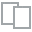
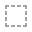
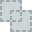
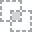
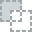
...
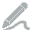
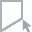
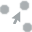
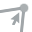
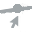

In [19]:
from dataprep.eda import plot_correlation

plot_correlation(data[continuous + response], 'LogSalePrice')

Based on this, we'll take `GrLivArea` as an interesting predictor to explore below.

Before we do that, let's get `dataprep` to report on the distributions. Click on "show stats and insights" to get more information. Here are some relevant facts about this part of the data: 

* Some predictors have missing values.
* Many of the predictors are skewed.
* Many of the predictors have a significant proportion of zeros. 

Interestingly, there are duplicate rows. These are potentially multiple sales of the same houses.

  0%|                                                                                         | 0/2229 [00:00<…


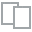
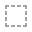
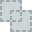
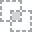
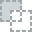
...
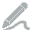
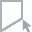
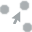
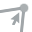
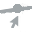

In [20]:
from dataprep.eda import plot

plot(data[continuous])

## 4.2 Data transformation

The `GrLivArea` predictor is quite right skewed, suggesting that a transformation might be useful. 

  0%|                                                                                          | 0/107 [00:00<…


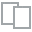
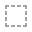
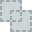
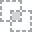
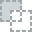
...
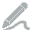
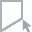
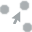
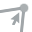
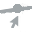

In [22]:
from dataprep.eda import plot

plot(data, 'GrLivArea')

Below, we plot the relationship with the response for the original predictor and after a log transformation. 

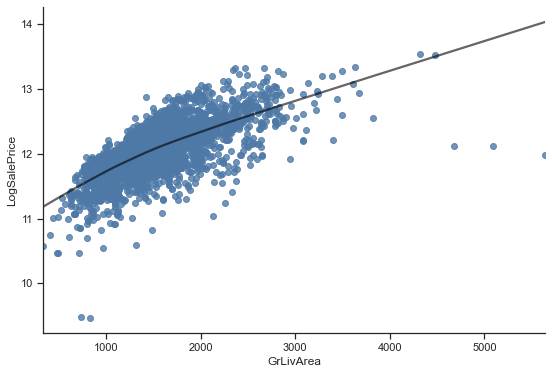

In [23]:
sns.regplot(data['GrLivArea'], data['LogSalePrice'], 
            lowess=True, line_kws={'color':'black', 'alpha':0.6})
sns.despine()
plt.show()

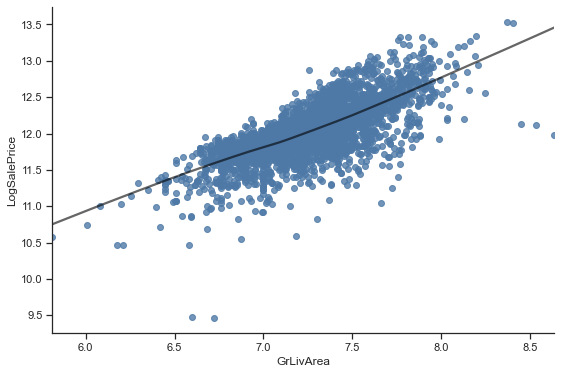

In [24]:
sns.regplot(np.log(data['GrLivArea']), data['LogSalePrice'], 
            lowess=True,  line_kws={'color':'black', 'alpha':0.6})
sns.despine()
plt.show()

Here is how you can do Yeo-Johnson transformation for a single predictor. 

In [25]:
# Yeo-Johnson transformation
from sklearn.preprocessing import PowerTransformer

# YJ is the default, the method can also do the Box-Cox transformation
yj = PowerTransformer(method='yeo-johnson')
train['GrLivAreaYJ']  = yj.fit_transform(train[['GrLivArea']])
valid['GrLivAreaYJ'] = yj.transform(valid[['GrLivArea']])

The transformation makes the variable approximately symmetric, as desired.

  0%|                                                                                          | 0/107 [00:00<…


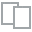
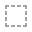
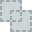
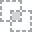
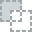
...
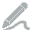
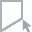
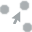
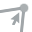
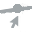

In [26]:
plot(train, 'GrLivAreaYJ')

## 4.1 Comparing specifications

To make modelling choices, we should experiment. Below, we train a linear regression with and without transforming `GrLivArea` and compare the predictive accuracy on the validation set. 

The transformation does seem to help.

In [27]:
# Initialise table
rows = ['No transformation', 'Yeo-Johnson transformation']
columns=['RMSE', 'R-Squared', 'MAE']
results = pd.DataFrame(0.0, columns=columns, index=rows)

for i in range(len(rows)):

    # Design matrices
    if i==0:
        predictor = ['GrLivArea']
    else: 
        predictor = ['GrLivAreaYJ']
    
    X_train =  train[predictor]
    X_valid = valid[predictor]
    
    # Fit model
    ols = LinearRegression().fit(X_train, y_train)

    # validation set predictions
    y_pred = ols.predict(X_valid)
    results.iloc[i, 0] = np.sqrt(mean_squared_error(y_valid, y_pred))
    results.iloc[i, 1] = r2_score(y_valid, y_pred)
    results.iloc[i, 2] = mean_absolute_error(y_valid, y_pred)

results.round(3)

,RMSE,R-Squared,MAE
No transformation,0.290,0.516,0.219
Yeo-Johnson transformation,0.279,0.552,0.214


Note that we use a single predictor for illustrative purposes. Ideally, we should make final decision based on a full model. 

# 5. Nominal predictors

## 5.1 Some EDA

We'll use `sweetviz` for EDA this time, as it's more informative for categorical variables.

When you run the next cell, the report should pop up as a separate browser tab. Click on "associations" for an overview of the associations between the variables. Click on the tabs for each variable and detailed results will appear on the right.

In [29]:
import sweetviz as sv

report = sv.analyze(data[nominal + response], target_feat='LogSalePrice')
report.show_html()

                                             |                                             | [  0%]   00:00 ->…

Report SWEETVIZ_REPORT.html was generated! NOTEBOOK/COLAB USERS: the web browser MAY not pop up, regardless, the report IS saved in your notebook/colab files.


We learn, for example. that `Neighbourhood` is the categorical variable with strongest association with the response. Therefore, we'll use it as our main example in this section.

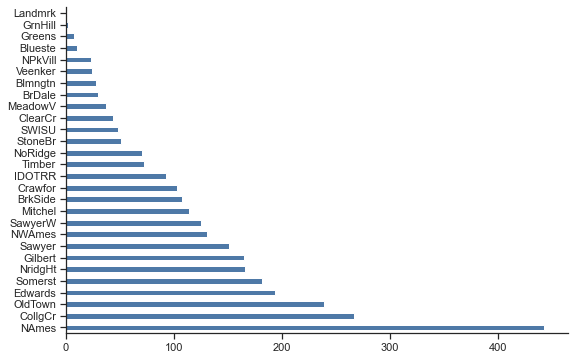

In [30]:
# We need to reset these settings after sweeviz
sns.set_context('notebook') 
sns.set_style('ticks')
sns.set_palette(colours) 
%matplotlib inline
plt.rcParams['figure.figsize'] = (9, 6)

# Now, the plot itself. 
data['Neighborhood'].value_counts().plot(kind='barh')
sns.despine()
plt.show()

## 5.2 Sparse categories

Some neighbourhoods have very few observations. Therefore, we can merge them into an "other" category.  

In [31]:
variable = 'Neighborhood'

counts = train[variable].value_counts() 
for level in counts.index:
    if counts[level] < 10:
        train.loc[train[variable]==level, variable] = 'Other'
        valid.loc[valid[variable]==level, variable] = 'Other'

## 5.3 One-hot and dummy encoding

The next cell shows you how to one-hot encode the `Neighborhood` variable. You can also use [scikit-learn](https://scikit-learn.org/stable/modules/generated/sklearn.preprocessing.OneHotEncoder.html).  

In [32]:
# note: you can also do this with scikit-learn
variable = 'Neighborhood'
dummies = pd.get_dummies(data[variable],  prefix = variable)
dummies.head()

,Neighborhood_Blmngtn,Neighborhood_Blueste,Neighborhood_BrDale,Neighborhood_BrkSide,Neighborhood_ClearCr,Neighborhood_CollgCr,Neighborhood_Crawfor,Neighborhood_Edwards,Neighborhood_Gilbert,Neighborhood_Greens,...,Neighborhood_NoRidge,Neighborhood_NridgHt,Neighborhood_OldTown,Neighborhood_SWISU,Neighborhood_Sawyer,Neighborhood_SawyerW,Neighborhood_Somerst,Neighborhood_StoneBr,Neighborhood_Timber,Neighborhood_Veenker
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,1,0,...,0,0,0,0,0,0,0,0,0,0


Since we need dummy encoding for the linear regression model, we add the `drop_first=True` to remove one of the columns.  We then merge the dummies into the original dataframe and update the list of predictors. 

Alternatively, you can start with one-hot encoding and drop one of the columns. This is useful if you want to choose the reference category. 

In [33]:
variable = 'Neighborhood'
dummies = pd.get_dummies(data[variable],  prefix = variable, drop_first=True)

train = train.join(dummies.loc[index_train, :])
valid = valid.join(dummies.loc[index_valid, :])

neighborhood_dummies = list(dummies.columns)

## 5.4 Target statistics

One-hot encoding creates many dummy variables when categorical predictors with high cardinality, which has disadvantages.

Methods based on target statistics instead create a single feature that approximates the expected value of the response given the category that each observation belongs to. The disadvantage is that such methods cause target leakage. 

The `category_encoders` package makes it easy for us to experiment with different methods. The target encoder is the original version of this approach. The other approaches mitigate target leakage. 

In [35]:
from category_encoders.target_encoder import TargetEncoder
from category_encoders.leave_one_out import LeaveOneOutEncoder
from category_encoders.james_stein import JamesSteinEncoder
from category_encoders.glmm import GLMMEncoder
from category_encoders.cat_boost import CatBoostEncoder

# This cell is a bit repetitive to keep the code simpler

predictor = ['Neighborhood']

encoder = TargetEncoder().fit(train[predictor], y_train) # we must use the training set for this
train['NeighborhoodTE'] = encoder.transform(train[predictor])
valid['NeighborhoodTE'] = encoder.transform(valid[predictor])

encoder = LeaveOneOutEncoder().fit(train[predictor], y_train) 
train['NeighborhoodLeaveOneOut'] = encoder.transform(train[predictor])
valid['NeighborhoodLeaveOneOut'] = encoder.transform(valid[predictor])

encoder =  GLMMEncoder().fit(train[predictor], y_train)
train['NeighborhoodGLMM'] = encoder.transform(train[predictor])
valid['NeighborhoodGLMM'] = encoder.transform(valid[predictor])
from category_encoders.cat_boost import CatBoostEncoder
encoder = CatBoostEncoder().fit(train[predictor], y_train) 
train['NeighborhoodCatBoost'] = encoder.transform(train[predictor])
valid['NeighborhoodCatBoost'] = encoder.transform(valid[predictor])

Here's a visualisation of the GLMM encoder. 

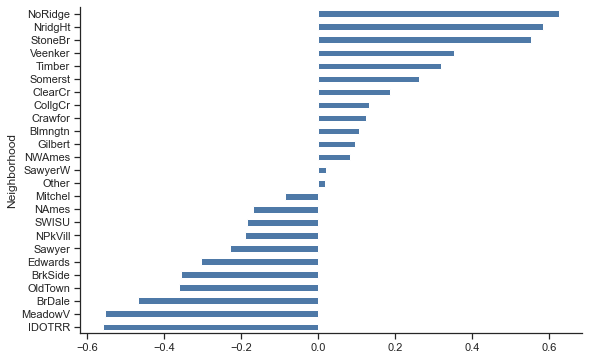

In [36]:
train.groupby('Neighborhood')['NeighborhoodGLMM'].mean().sort_values().plot(kind='barh')
sns.despine()
plt.show()

Let's compare the different approaches. All methods based on target statistics give example the same results. They would not do better than dummy encoding here, as we are not using many predictors relative to the size of the training data. However, they will prove useful in other settings. 

In [37]:
rows = ['Dummy encoding', 'Target encoder', 'Leave-one-out encoder', 
      'GLMM encoder', 'CatBoost encoder']

columns=['RMSE', 'R-Squared', 'MAE']

results = pd.DataFrame(0.0, columns=columns, index=rows)

for i in range(len(rows)):

    if i==0:
        predictors = ['GrLivAreaYJ'] + neighborhood_dummies
    elif i==1: 
        predictors = ['GrLivAreaYJ', 'NeighborhoodTE'] 
    elif i==2:
        predictors = ['GrLivAreaYJ', 'NeighborhoodLeaveOneOut']
    elif i==3: 
        predictors = ['GrLivAreaYJ', 'NeighborhoodGLMM']
    elif i==4: 
        predictors = ['GrLivAreaYJ', 'NeighborhoodCatBoost']  
    
    X_train =  train[predictors]
    X_valid = valid[predictors]
    
    # Fit model
    ols = LinearRegression().fit(X_train, y_train)

    # validation set predictions
    y_pred = ols.predict(X_valid)
    results.iloc[i, 0] = np.sqrt(mean_squared_error(y_valid, y_pred))
    results.iloc[i, 1] = r2_score(y_valid, y_pred)
    results.iloc[i, 2] = mean_absolute_error(y_valid, y_pred)

results.round(3)

,RMSE,R-Squared,MAE
Dummy encoding,0.196,0.780,0.147
Target encoder,0.198,0.775,0.149
Leave-one-out encoder,0.198,0.775,0.149
GLMM encoder,0.198,0.775,0.149
CatBoost encoder,0.198,0.775,0.149


# 6. Discrete predictors

Let's explore `GarageCars`, the discrete predictor that is most correlated with the response variable.  

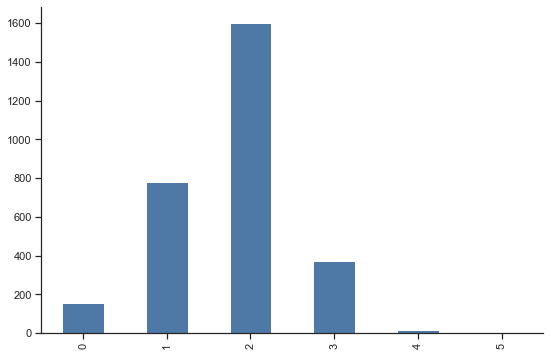

In [38]:
data['GarageCars'] = data['GarageCars'].fillna(0) # there's one missing value, more on this soon
data['GarageCars'] = data['GarageCars'].astype(int)

data['GarageCars'].value_counts().sort_index().plot(kind='bar')
sns.despine()
plt.show()

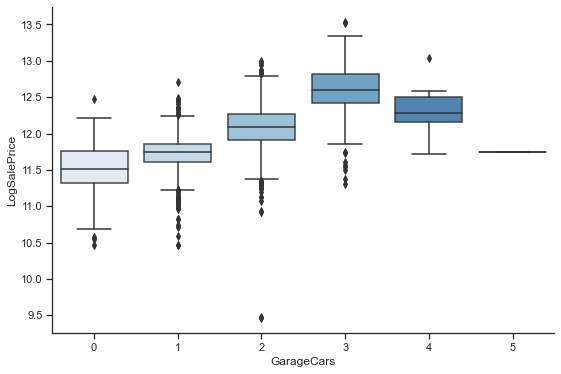

In [39]:
sns.boxplot(x = data['GarageCars'], y = data['LogSalePrice'], boxprops=dict(alpha=.9), palette='Blues')
sns.despine()
plt.show()

We usually process discrete predictors in the same way as continuous predictors. However, if the number of possible values is not too high, it may be worth it to create dummy variables instead. 

In [40]:
variable = 'GarageCars'

dummies = pd.get_dummies(data[variable],  prefix = variable)

# Merge sparse categories
dummies['GarageCars_3'] = dummies['GarageCars_3'] + dummies['GarageCars_4'] + dummies['GarageCars_5'] 

# Drop reference and merged categories
dummies = dummies.drop(['GarageCars_0', 'GarageCars_4', 'GarageCars_5'], axis=1)

train = train.join(dummies.loc[index_train, :])
valid = valid.join(dummies.loc[index_valid, :])

garage_dummies = list(dummies.columns)

The dummy variables perform better in a simple model.

In [41]:
train['GarageCars'] = train['GarageCars'].fillna(0)
valid['GarageCars'] = valid['GarageCars'].fillna(0)

rows = ['Baseline', 'Linear', 'Dummies']
columns=['RMSE', 'R-Squared', 'MAE']
results = pd.DataFrame(0.0, columns=columns, index=rows)

for i in range(len(rows)):

    if i==0:
        predictors = ['GrLivAreaYJ'] 
    elif i==1: 
        predictors = ['GrLivAreaYJ', 'GarageCars']
    elif i==2:
        predictors = ['GrLivAreaYJ'] + garage_dummies
    
    X_train =  train[predictors]
    X_valid = valid[predictors]
    
    # Fit model
    ols = LinearRegression().fit(X_train, y_train)

    # validation set predictions
    y_pred = ols.predict(X_valid)
    results.iloc[i, 0] = np.sqrt(mean_squared_error(y_valid, y_pred))
    results.iloc[i, 1] = r2_score(y_valid, y_pred)
    results.iloc[i, 2] = mean_absolute_error(y_valid, y_pred)

results.round(3)

,RMSE,R-Squared,MAE
Baseline,0.279,0.552,0.214
Linear,0.235,0.683,0.174
Dummies,0.231,0.693,0.171


# 7. Ordinal Predictors

The `OverallQual` variable is one of the most informative predictors in the dataset.

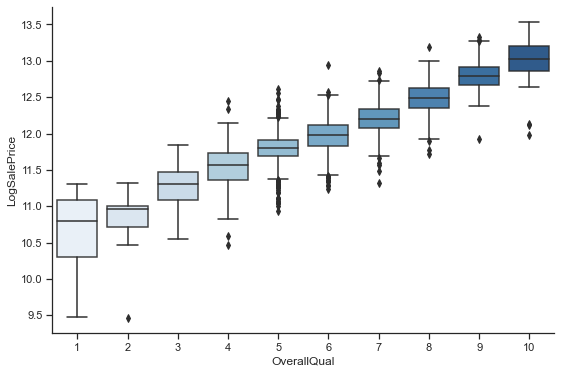

In [42]:
sns.boxplot(x = data['OverallQual'], y = data['LogSalePrice'], boxprops=dict(alpha=.9), palette='Blues')
sns.despine()
plt.show()

In linear regression, we usually treat ordinal predictions like nominal predictors. Unfortunately, we then lose information from the ordering of the categories.

In [43]:
variable = 'OverallQual'
dummies = pd.get_dummies(data[variable],  prefix = variable, drop_first=True)

train = train.join(dummies.loc[index_train, :])
valid = valid.join(dummies.loc[index_valid, :])

quality_dummies = list(dummies.columns) 

Later in the unit, we'll study tree-based methods, in which we case we case use ordinal encoding. I'll use `KitchenQual` as an example.

In [44]:
data['KitchenQual'].value_counts()

TA    1494
Gd    1160
Ex     205
Fa      70
Po       1
Name: KitchenQual, dtype: int64

Below, we replace the labels with integers that reflect the ordering of the categories.

In [45]:
keys = {
        'Po': 1, # poor, noting that we could already merge it with fair here
        'Fa': 2, # fair
        'TA': 3, # typical/average
        'Gd': 4, # good
        'Ex': 5, # excellent
}

variable = 'KitchenQual'
data[variable] = data[variable].replace(keys)

# 8 Missing values

## 8.1 Some EDA

The `missingno` package is useful to get a general sense of missing data patterns.  

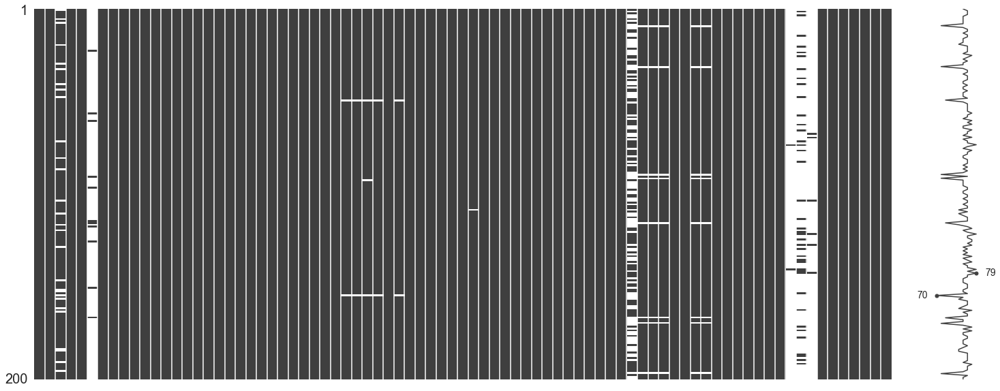

In [46]:
import missingno as msno
msno.matrix(data.sample(200))
plt.show()

The `dataprep` library can generate a useful report on missing values.

  0%|                                                                                          | 0/713 [00:00<…


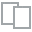
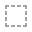
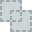
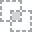
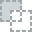
...
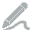
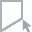
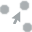
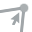
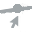

In [47]:
from dataprep.eda.missing import plot_missing

plot_missing(data)

We can also use `pandas` to get a list of predictors ranked by missing value counts.

In [48]:
data.isnull().sum().sort_values(ascending=False).head(10)

PoolQC          2917
MiscFeature     2824
Alley           2732
Fence           2358
FireplaceQu     1422
LotFrontage      490
GarageQual       159
GarageFinish     159
GarageYrBlt      159
GarageCond       159
dtype: int64

## 8.2 Missing indicators

In this dataset, missing values often occur because the variable is not applicable (the house does not a pool, garage, fireplace,etc). 

In this case, we can create dummy variables to indicate missing values.  For categorical data, missing becomes a category. 

In [49]:
# Indicator variable for no Garage
data['NoGarage'] = data['GarageYrBlt'].isnull().astype(int)
                          
# We need to fill the missing values with something                   
data['GarageArea'] = data['GarageArea'].fillna(0)
data['GarageYrBlt'] = data['GarageYrBlt'].fillna(data['GarageYrBlt'].median())
data['GarageCars'] = data['GarageCars'].fillna(0)

Bonus: we can use a regular expression to find all related predictors. Some are of the columns are categorical.

In [50]:
# The regular expression returns a match when the column label starts with "Garage"
data.columns[data.columns.str.match(r'^Garage.*')] 

Index(['GarageType', 'GarageYrBlt', 'GarageFinish', 'GarageCars', 'GarageArea',
       'GarageQual', 'GarageCond'],
      dtype='object')

## 8.3 Imputation

The only predictor that seems to require imputation is `LotFrontage`. One option is to use a simple imputation method such as to replace missing values by the median:

In [51]:
data['LotFrontageImputed']=data['LotFrontage'].fillna(data['LotFrontage'].median())

We could also do this by neighbourhood.

A more sophisticated option is to use the remaining predictors to help fill the missing values.

In [52]:
data.corr()['LotFrontage'].abs().sort_values(ascending=False).head(5).round(5)

LotFrontageImputed    1.00000
LotFrontage           1.00000
LotArea               0.49131
1stFlrSF              0.45739
MSSubClass            0.42014
Name: LotFrontage, dtype: float64

The scikit-learn [IterativeImputer](https://scikit-learn.org/stable/modules/generated/sklearn.impute.IterativeImputer.html#sklearn.impute.IterativeImputer) uses all provided features to iteratively impute values for each other. In the following cell only `LotFrontage` has missing values, therefore scikit-learn will complete the imputation in one round. 

In [53]:
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer

predictors = ['LotFrontage','LotArea','1stFlrSF','GarageArea','TotalBsmtSF']
X_train = data.loc[index_train, predictors]
imputer =  IterativeImputer()
imputer.fit(X_train)
data[predictors] = imputer.transform(data[predictors])

# 9 Interaction features

To conclude, let's discuss potential interactions between categorical and numerical features.  Using our knowledge of real estate prices, we can for example conjecture is that the relationship between the value and the size of the house depends on the location and the quality of the property.

To facilitate visualisation, let's take quality as an example and create a dummy variable that indicates that a house is of above average quality.

In [54]:
train['HighQual'] = (train['OverallQual']>5).astype(int)
valid['HighQual'] = (valid['OverallQual']>5).astype(int)

The next figure shows the interaction effect. 

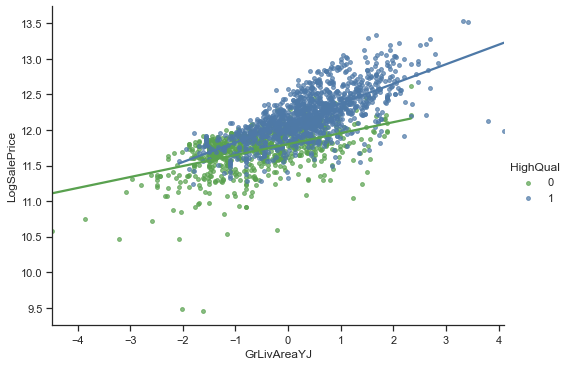

In [55]:
y, x, z = 'LogSalePrice', 'GrLivAreaYJ', 'HighQual'
ax = sns.lmplot(x, y, data=train, hue=z, height=5, aspect=1.4, ci=None, 
                scatter_kws={'s': 15,'alpha': 0.7},  palette=np.array(colours)[[4,0]]).ax
plt.show()

Adding an interaction feature to the data frame is simple.

In [56]:
train['AreaXQual'] = train['GrLivAreaYJ']*train['HighQual']
valid['AreaXQual'] = valid['GrLivAreaYJ']*valid['HighQual']